In [ ]:
!nvidia-smi

Mon Aug 14 18:14:41 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.0/613.0 kB 6.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
from IPython.display import display,Image
from IPython import display
import os
display.clear_output()
! yolo mode = checks


WARNING ⚠️ 'yolo mode=checks' is deprecated. Use 'yolo checks' instead.
Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.2/78.2 GB disk)


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="slFmbezLlhYqvHDYT4mL")
project = rf.workspace("school-research").project("football-and-player-detection-ef0dh")
dataset = project.version(8).download("yolov8")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 6.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=b3915f89283a7e23360bfaf90e149e373036b4b7c2ab77ba6c9dfe164184a851
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: idna
    Found e

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.154, to fix: `pip install ultralytics==8.0.134`


Extracting Dataset Version Zip to Football-And-Player-Detection--8 in yolov8:: 100%|██████████| 2268/2268 [00:00<00:00, 3048.17it/s]


In [ ]:
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz = 640

100% 49.7M/49.7M [00:00<00:00, 314MB/s]
Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Football-And-Player-Detection--8/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=

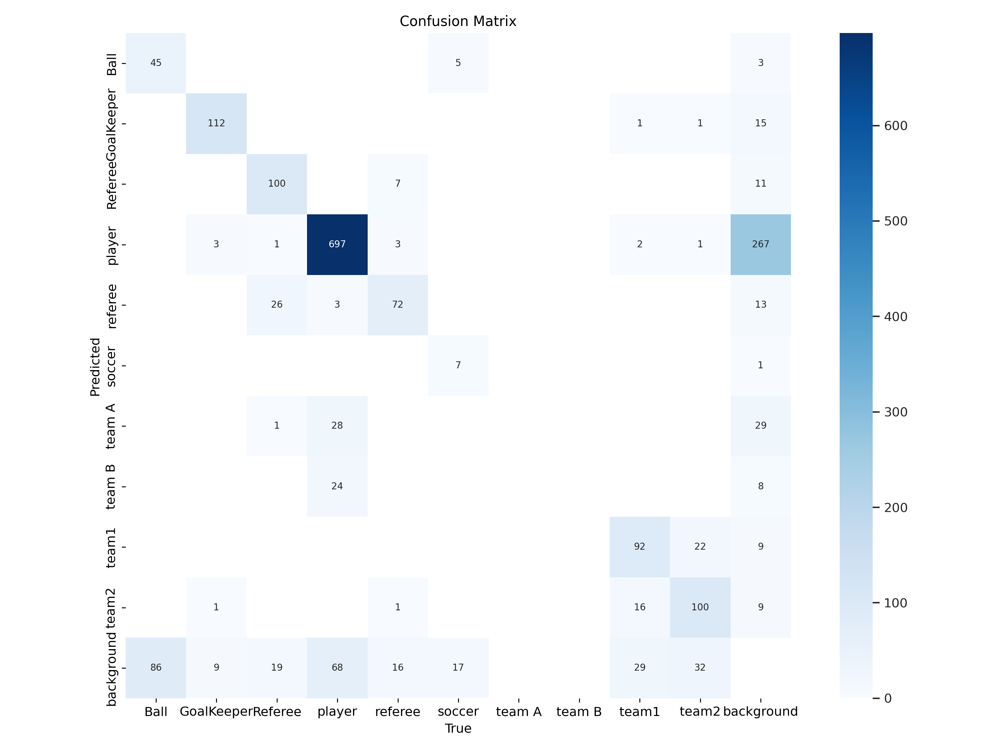

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png',width=850)

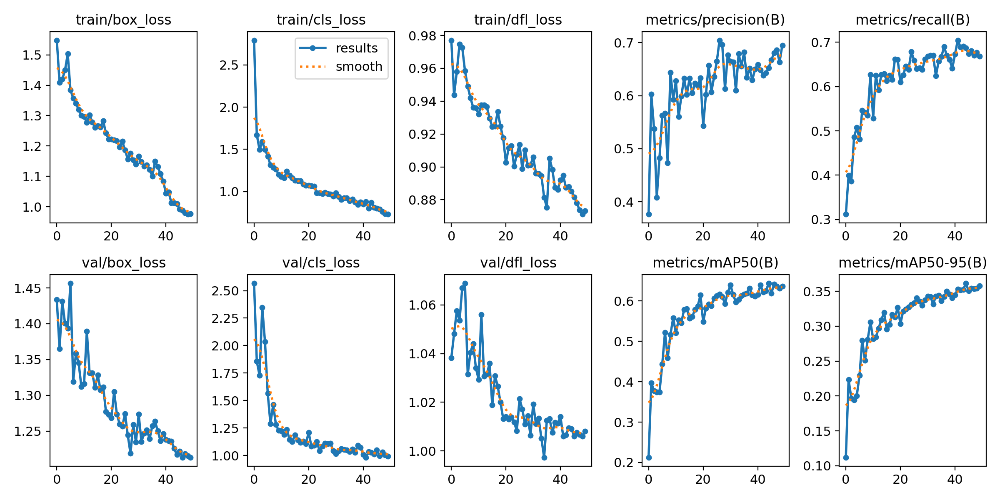

In [ ]:
Image(filename=f'/content/runs/detect/train/results.png',height=500,width=850)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients
val: Scanning /content/Football-And-Player-Detection--8/valid/labels.cache... 186 images, 11 backgrounds, 0 corrupt: 100% 186/186 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 12/12 [00:08<00:00,  1.40it/s]
                   all        186       1647      0.655      0.688      0.645      0.363
                  Ball        186        131      0.796      0.405      0.469      0.179
            GoalKeeper        186        125      0.751       0.92      0.884      0.503
               Referee        186        147      0.722      0.769      0.836      0.491
                player        186        820      0.599       0.92      0.646      0.465
               referee        186         99       0.54      0.788      0.616      0.366
                soccer        186    

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.50 source={dataset.location}/test/images save=True

Ultralytics YOLOv8.0.154 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25845550 parameters, 0 gradients

image 1/97 /content/Football-And-Player-Detection--8/test/images/00010_jpg.rf.3cf1ac5ce1eb9f25981909a46a545b0d.jpg: 640x640 1 Referee, 37.9ms
image 2/97 /content/Football-And-Player-Detection--8/test/images/00015_jpg.rf.0b348055f52390d51cc56c4eab231260.jpg: 640x640 1 Referee, 5 players, 35.7ms
image 3/97 /content/Football-And-Player-Detection--8/test/images/00033_jpg.rf.03896e38f35d6736aac8ae96c6704c37.jpg: 640x640 1 GoalKeeper, 1 player, 34.7ms
image 4/97 /content/Football-And-Player-Detection--8/test/images/00045_jpg.rf.462f119845bfba0a82fa4dff78256581.jpg: 640x640 1 Referee, 4 players, 34.6ms
image 5/97 /content/Football-And-Player-Detection--8/test/images/00051_jpg.rf.ae74e035a447e845b3da4c2c097fb031.jpg: 640x640 1 GoalKeeper, 6 players, 34.6ms
image 6/97 /content/Football-And-Player-Detection--8/test/images/00063_jpg.rf.7d7b46

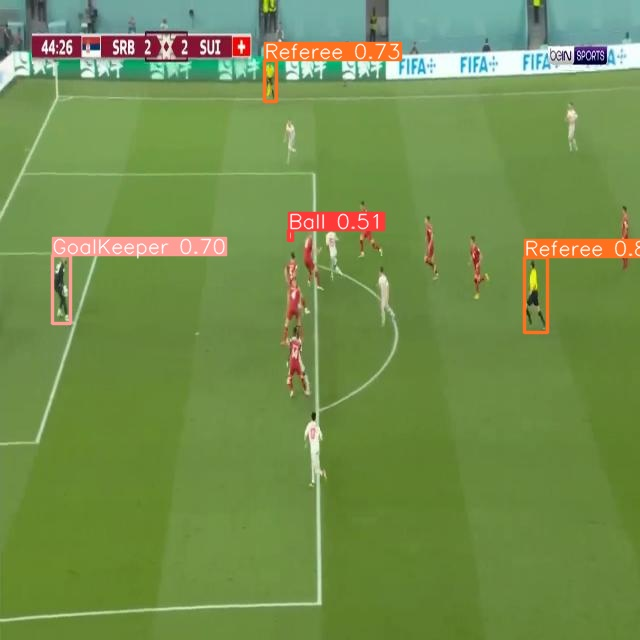

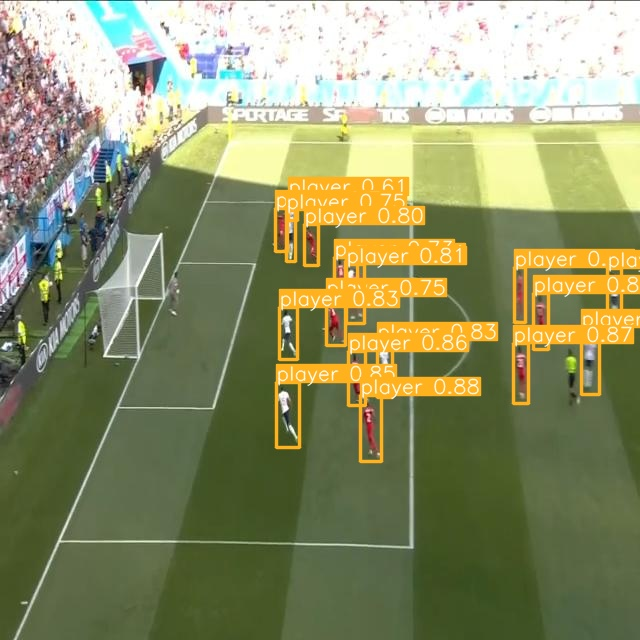

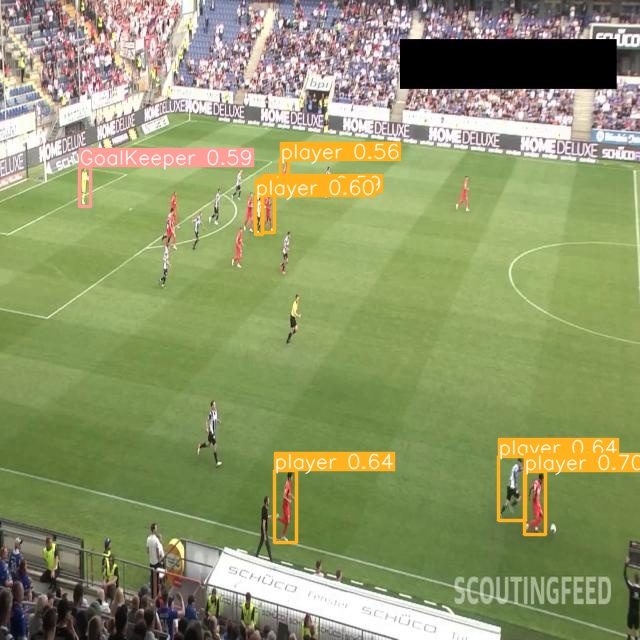

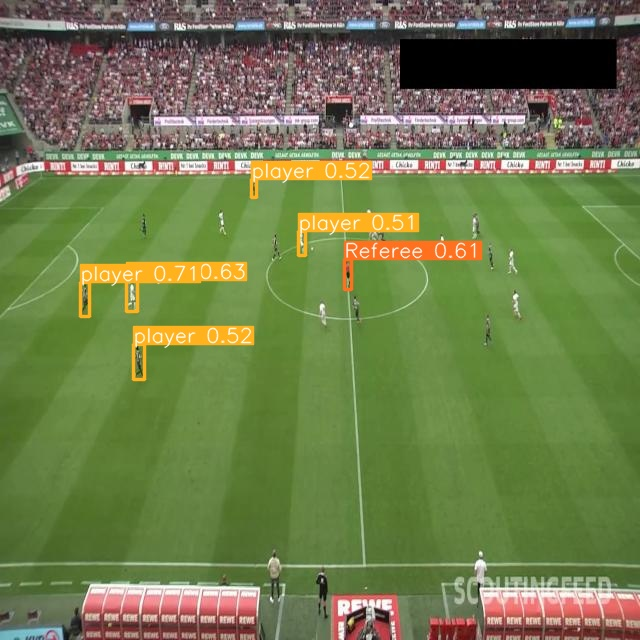

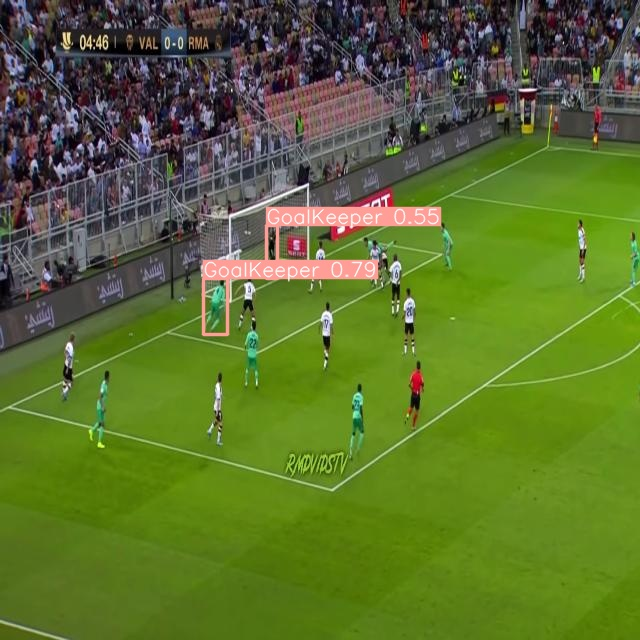

...

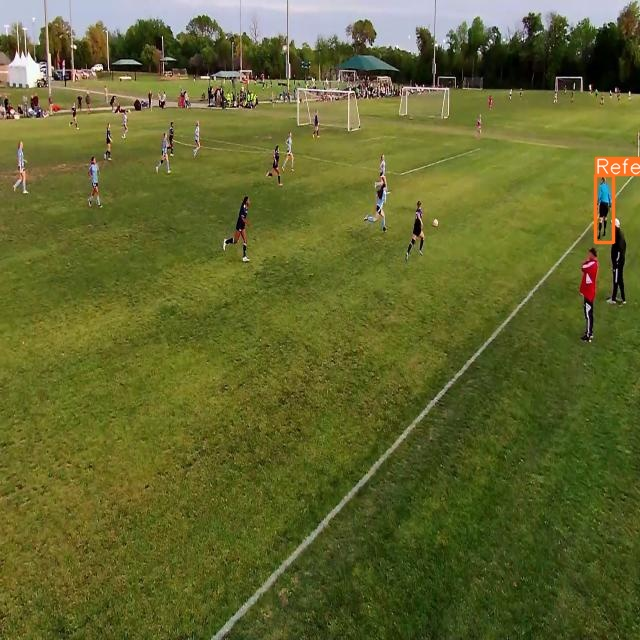

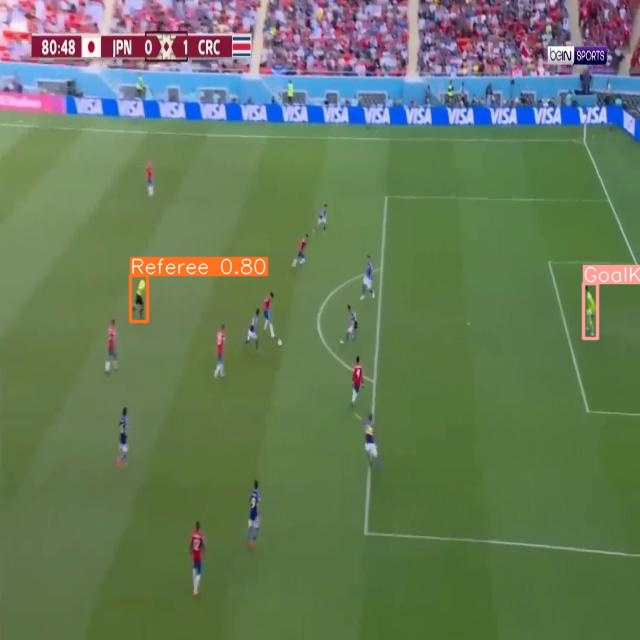

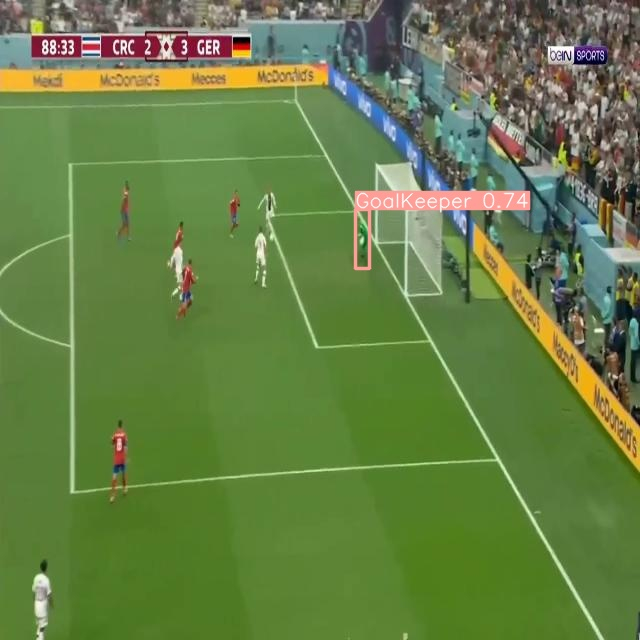

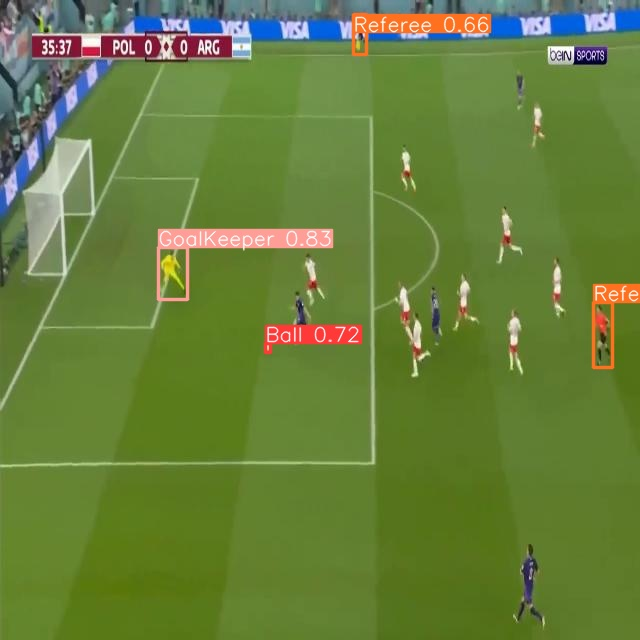

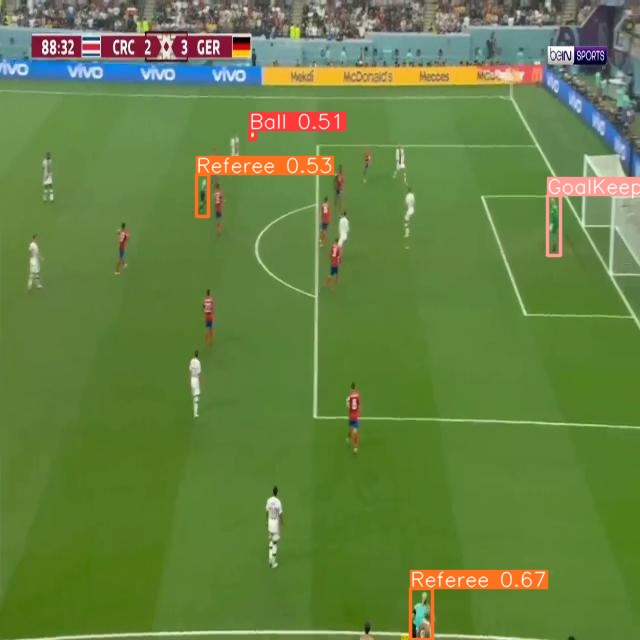

In [ ]:
import glob
from IPython.display import display,Image

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, height=500))
      print("\n")

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
#model = YOLO("yolov8m.pt")
#!touch data.yaml

Mounted at /content/gdrive
